In [1]:
import pandas as pd
import geopandas as gpd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

### Timeseries of crime types

In [ ]:
recent_df = pd.read_csv('data/MPS LSOA Level Crime (most recent 24 months).csv')
historical_df = pd.read_csv('data/MPS LSOA Level Crime (Historical).csv')

,LSOA Code,LSOA Name,Borough,Major Category,Minor Category,202302,202303,202304,202305,202306,...,202405,202406,202407,202408,202409,202410,202411,202412,202501,Refreshed Date
0,E01000006,Barking and Dagenham 016A,E09000002,ARSON AND CRIMINAL DAMAGE,CRIMINAL DAMAGE,0,1,1,0,0,...,1,0,0,0,0,0,2,0,1,05/02/2025
1,E01000006,Barking and Dagenham 016A,E09000002,BURGLARY,BURGLARY - RESIDENTIAL,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,05/02/2025
2,E01000006,Barking and Dagenham 016A,E09000002,BURGLARY,BURGLARY IN A DWELLING,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,05/02/2025
3,E01000006,Barking and Dagenham 016A,E09000002,DRUG OFFENCES,POSSESSION OF DRUGS,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,05/02/2025
4,E01000006,Barking and Dagenham 016A,E09000002,DRUG OFFENCES,TRAFFICKING OF DRUGS,0,0,1,0,1,...,0,0,0,0,0,0,1,0,0,05/02/2025


In [114]:
# Lets merge these two datasets
df = pd.merge(historical_df, recent_df, on=['LSOA Code', 'LSOA Name', 'Borough', 'Major Category', 'Minor Category'], how='outer').fillna(0).sort_index(axis = 1)
df.head()

,201004,201005,201006,201007,201008,201009,201010,201011,201012,201101,...,202410,202411,202412,202501,Borough,LSOA Code,LSOA Name,Major Category,Minor Category,Refreshed Date
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,E09000002,E01000006,Barking and Dagenham 016A,ARSON AND CRIMINAL DAMAGE,ARSON,0
1,1.0,3.0,0.0,2.0,0.0,2.0,0.0,1.0,0.0,0.0,...,0.0,2.0,0.0,1.0,E09000002,E01000006,Barking and Dagenham 016A,ARSON AND CRIMINAL DAMAGE,CRIMINAL DAMAGE,05/02/2025
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,E09000002,E01000006,Barking and Dagenham 016A,BURGLARY,BURGLARY - RESIDENTIAL,05/02/2025
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,E09000002,E01000006,Barking and Dagenham 016A,BURGLARY,BURGLARY BUSINESS AND COMMUNITY,0
4,3.0,0.0,0.0,1.0,1.0,3.0,1.0,1.0,3.0,2.0,...,0.0,0.0,0.0,0.0,E09000002,E01000006,Barking and Dagenham 016A,BURGLARY,BURGLARY IN A DWELLING,05/02/2025


In [210]:
df_yearly = df.copy()

# 获取所有的年份范围，假设是2014到2023年
years = range(2011, 2025)

# 对每一年进行循环，计算合计
for year in years:
    # 动态获取每一年的列名
    cols_to_sum = [col for col in df_yearly.columns if str(year) in str(col)]
    
    # 计算每一年合计的犯罪数量
    df_yearly[str(year)] = df_yearly[cols_to_sum].sum(axis=1)

# 创建包含每年数据的新的数据框
df_yearly = df_yearly[["LSOA Code", "Borough", "Major Category"] + [str(year) for year in years]]
df_yearly = df_yearly.groupby(['LSOA Code', "Borough", 'Major Category']).sum().reset_index()

# 显示结果
df_yearly

,LSOA Code,Borough,Major Category,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,E01000006,E09000002,ARSON AND CRIMINAL DAMAGE,4.0,9.0,5.0,8.0,8.0,8.0,5.0,12.0,7.0,6.0,5.0,6.0,5.0,5.0
1,E01000006,E09000002,BURGLARY,20.0,17.0,14.0,10.0,10.0,7.0,13.0,16.0,13.0,5.0,5.0,3.0,3.0,2.0
2,E01000006,E09000002,DRUG OFFENCES,10.0,1.0,6.0,8.0,6.0,1.0,3.0,14.0,6.0,25.0,16.0,17.0,5.0,3.0
3,E01000006,E09000002,MISCELLANEOUS CRIMES AGAINST SOCIETY,0.0,1.0,1.0,4.0,0.0,1.0,2.0,2.0,4.0,1.0,3.0,5.0,1.0,2.0
4,E01000006,E09000002,POSSESSION OF WEAPONS,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49782,E01035722,E09000033,PUBLIC ORDER OFFENCES,1.0,4.0,2.0,4.0,8.0,8.0,12.0,8.0,4.0,12.0,5.0,7.0,17.0,13.0
49783,E01035722,E09000033,ROBBERY,9.0,9.0,3.0,9.0,5.0,9.0,7.0,2.0,10.0,3.0,2.0,4.0,5.0,6.0
49784,E01035722,E09000033,THEFT,40.0,42.0,27.0,35.0,32.0,35.0,47.0,40.0,40.0,32.0,28.0,49.0,36.0,47.0
49785,E01035722,E09000033,VEHICLE OFFENCES,13.0,17.0,14.0,18.0,18.0,15.0,17.0,23.0,18.0,22.0,13.0,16.0,9.0,6.0


In [ ]:
# Timeseries of each Major Category. What are trends of each major category like?
drop_list = ['LSOA Code', 'Borough']
grouped_yearly = df_yearly.groupby(by=['Major Category']).agg('sum').drop(columns=drop_list)
# 设置 "Major Category" 为索引
grouped_yearly.head()

,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
Major Category,,,,,,,,,,,,,,
ARSON AND CRIMINAL DAMAGE,75996.0,64730.0,54764.0,57314.0,61020.0,62106.0,61604.0,56324.0,55500.0,49982.0,51781.0,51942.0,56048.0,55138.0
BURGLARY,100836.0,97910.0,87187.0,75886.0,70489.0,68306.0,75975.0,80291.0,80362.0,60216.0,52318.0,51660.0,55434.0,52492.0
DRUG OFFENCES,64931.0,55755.0,50292.0,44400.0,39823.0,39592.0,36528.0,36084.0,47455.0,54571.0,45372.0,43358.0,38284.0,38063.0
MISCELLANEOUS CRIMES AGAINST SOCIETY,8768.0,8130.0,7727.0,8823.0,9979.0,11346.0,11190.0,11005.0,11143.0,11070.0,11130.0,11709.0,11003.0,10081.0
POSSESSION OF WEAPONS,5550.0,4286.0,3992.0,4322.0,4788.0,5843.0,7726.0,7685.0,7257.0,6725.0,5975.0,6278.0,6266.0,4522.0


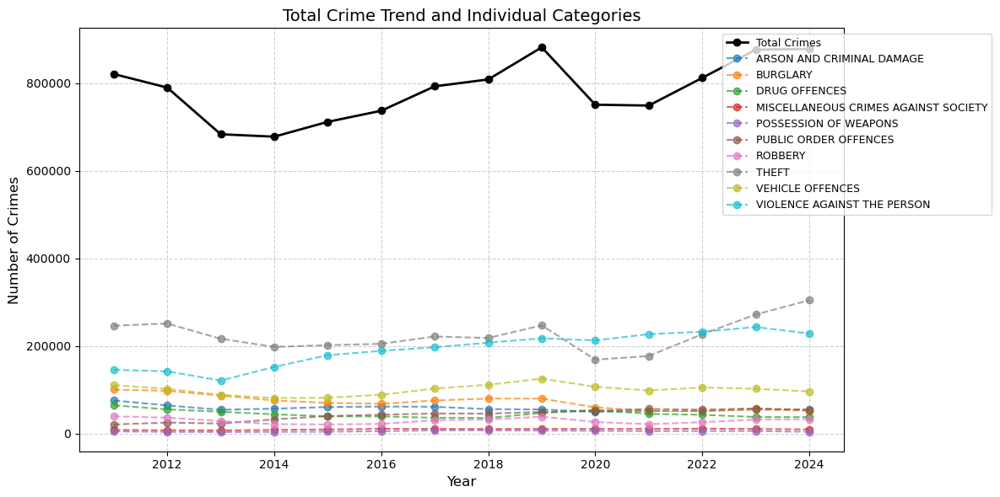

In [129]:
# 获取年份
years = grouped_yearly.columns.astype(int)

# 计算每年的犯罪总数
total_crimes = grouped_yearly.sum()

# 第一张图：总犯罪数量 + 各类别趋势
plt.figure(figsize=(12, 6))
plt.plot(years, total_crimes, marker='o', linestyle='-', color='black', linewidth=2, label='Total Crimes')

# 画出各单个犯罪类型的趋势
for category in grouped_yearly.index:
    plt.plot(years, grouped_yearly.loc[category], marker='o', linestyle='--', label=category, alpha=0.7)

plt.title("Total Crime Trend and Individual Categories", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Number of Crimes", fontsize=12)
plt.legend(fontsize=9, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()


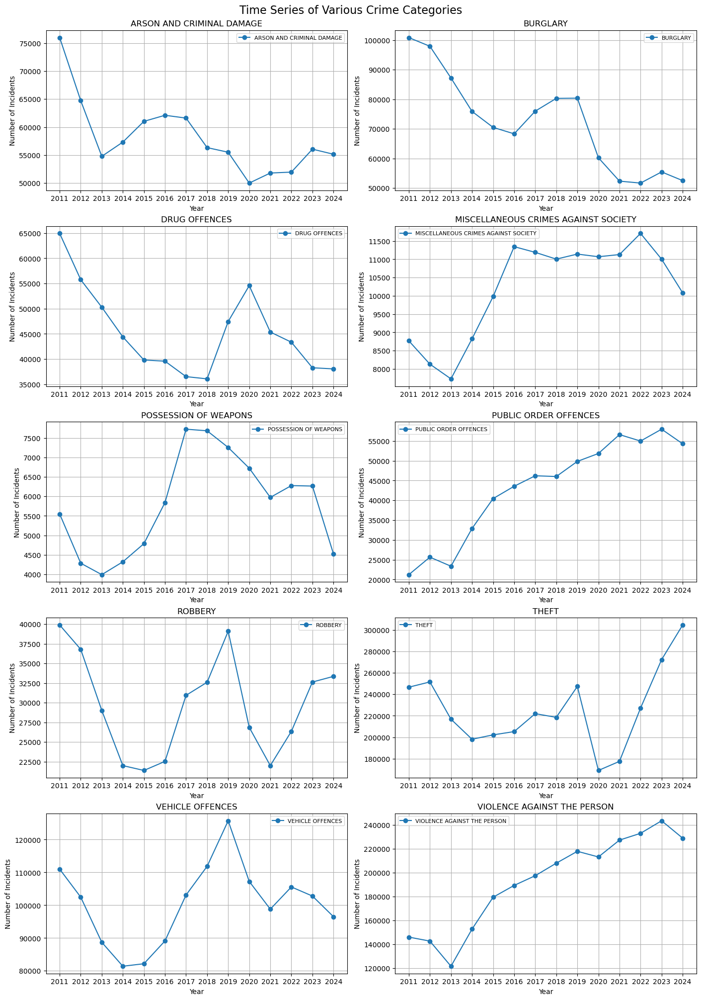

In [130]:
import matplotlib.pyplot as plt

# 确定子图的行列数
n_categories = len(grouped_yearly.index)  # 计算类别数
n_cols = 2  # 每行子图的列数
n_rows = (n_categories + n_cols - 1) // n_cols  # 计算需要的行数

# 创建子图网格
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 4 * n_rows), constrained_layout=True)
fig.suptitle("Time Series of Various Crime Categories", fontsize=16)

# 将 axes 扁平化，方便索引
axes = axes.flatten()

# 为每个类别生成单独的子图
for i, category in enumerate(grouped_yearly.index):
    ax = axes[i]
    ax.plot(grouped_yearly.columns, grouped_yearly.loc[category], marker='o', label=category)
    ax.set_title(category, fontsize=12)
    ax.set_xlabel("Year", fontsize=10)
    ax.set_ylabel("Number of Incidents", fontsize=10)
    ax.grid(visible=True)
    ax.legend(fontsize=8)

# 如果子图数量不满网格，隐藏多余的子图
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.show()


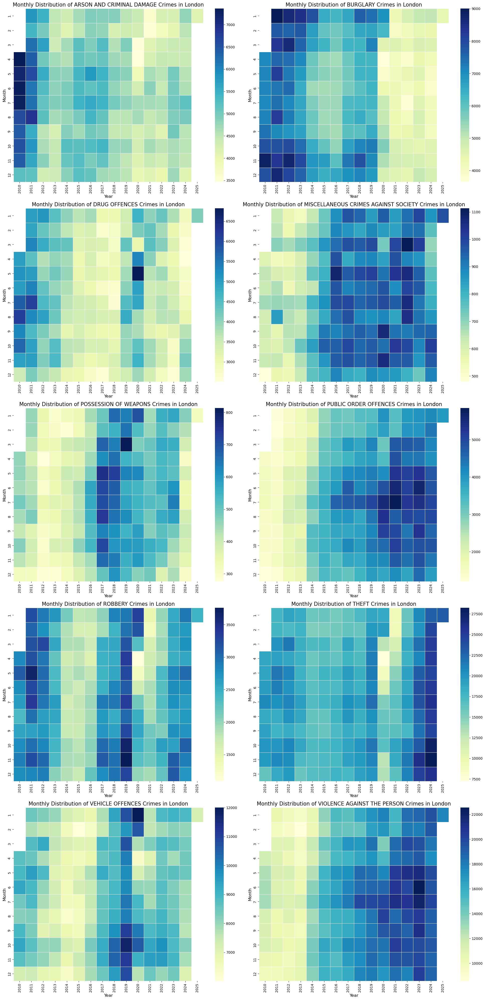

In [125]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 假设 df 是你的 DataFrame 数据

# 筛选数值列，排除非时间列
numeric_cols = df.select_dtypes(include=['number']).columns

# 获取所有的 Major Category
major_categories = df['Major Category'].unique()

# 计算子图布局
n_categories = len(major_categories)
n_rows = (n_categories + 1) // 2  # 保证能排满
fig, axes = plt.subplots(n_rows, 2, figsize=(20, 8 * n_rows))
axes = axes.flatten()  # 使axes为一维数组，方便索引

for i, cat in enumerate(major_categories):
    # 筛选当前类别的数据
    filtered_data = df[df['Major Category'] == cat]
    
    # 确保 numeric_cols 只包含数值列
    numeric_cols = filtered_data.select_dtypes(include=['number']).columns

    # 按时间（列名）聚合
    grouped = filtered_data[numeric_cols].sum()
    
    # 转换成 DataFrame 并拆分时间
    grouped_df = grouped.reset_index()
    grouped_df.columns = ['Date', 'Count']
    
    # 从 'Date' 列提取月份和年份
    grouped_df['Month'] = grouped_df['Date'].str[4:6]  # 提取月份
    grouped_df['Year'] = grouped_df['Date'].str[:4]  # 提取年份
    
    # 确保月份为整数并进行排序
    grouped_df['Month'] = grouped_df['Month'].astype(int)
    
    # 根据 'Year' 和 'Month' 进行透视
    monthly_pivot = grouped_df.pivot(index="Month", columns="Year", values="Count")
    
    # 填充缺失值
    monthly_pivot = monthly_pivot

    # 画热力图
    sns.heatmap(monthly_pivot, cmap="YlGnBu", linewidths=.5, ax=axes[i])
    axes[i].set_title(f'Monthly Distribution of {cat} Crimes in London', fontsize=15)
    axes[i].set_xlabel('Year', fontsize=12)
    axes[i].set_ylabel('Month', fontsize=12)

# 调整布局
plt.tight_layout()
plt.show()


### spatial plot

In [203]:
UK_Borough = gpd.read_file('./data/London/London_Borough_Excluding_MHW.shp').sort_values(by='GSS_CODE').reset_index(drop=True)
UK_Borough

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
0,City of London,E09000001,314.942,24.546,T,None,None,"POLYGON ((531145.1 180782.1, 531143.8 180799.3..."
1,Barking and Dagenham,E09000002,3779.934,169.150,F,None,None,"MULTIPOLYGON (((543905.4 183199.1, 543905 1831..."
2,Barnet,E09000003,8674.837,0.000,F,None,None,"POLYGON ((524579.9 198355.2, 524594.3 198321.4..."
3,Bexley,E09000004,6428.649,370.619,F,None,None,"POLYGON ((547226.2 181299.3, 547320.9 181342.4..."
4,Brent,E09000005,4323.270,0.000,F,None,None,"POLYGON ((525201 182512.6, 525181.5 182521.1, ..."
5,Bromley,E09000006,15013.487,0.000,F,None,None,"POLYGON ((540373.6 157530.4, 540361.2 157551.9..."
6,Camden,E09000007,2178.932,0.000,T,None,None,"POLYGON ((528840.2 187217.8, 528834.6 187205.8..."
7,Croydon,E09000008,8649.441,0.000,F,None,None,"POLYGON ((535009.2 159504.7, 535005.5 159502, ..."
8,Ealing,E09000009,5554.428,0.000,F,None,None,"POLYGON ((510253.5 182881.6, 510249.9 182886, ..."
9,Enfield,E09000010,8220.025,0.000,F,None,None,"POLYGON ((531023.5 200933.6, 531039.9 200933.9..."


In [241]:
#load in the LSOA map 
UK_LSOA = gpd.read_file("./data/LSOA.gpkg")
UK_LSOA['area_km2'] = UK_LSOA.area*10**-6
UK_LSOA

,lsoa21cd,lsoa21nm,geometry,area_km2
0,E01000001,City of London 001A,"POLYGON ((532151.538 181867.433, 532152.5 1818...",0.129865
1,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532632.048 18...",0.228420
2,E01000003,City of London 001C,"POLYGON ((532153.703 182165.155, 532158.25 182...",0.059054
3,E01000005,City of London 001E,"POLYGON ((533619.062 181402.364, 533639.868 18...",0.189578
4,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",0.146537
...,...,...,...,...
4989,E01035718,Westminster 019G,"POLYGON ((528044.949 180617.984, 528046.344 18...",2.671900
4990,E01035719,Westminster 021F,"POLYGON ((530383.75 178784.828, 530376.55 1787...",0.140662
4991,E01035720,Westminster 021G,"POLYGON ((529856.151 178761.747, 529856.859 17...",0.151925
4992,E01035721,Westminster 023H,"POLYGON ((528641.815 178630.886, 528635.688 17...",0.216843


In [ ]:
# Merging shapefiles
def merge_shape_with_data(shapefile : gpd.GeoDataFrame, df : pd.DataFrame, index_in_shapefle : str = 'NAME',index_in_data : str = 'Borough'):
    '''
    For borough dataset: index_in_shapefile = 'NAME' and index_in_data = 'Borough'
    For lsoa dataset : index_in_shapefile = 'LSOA11NM; and index_in_data = 'LSOA Name'
    '''
    
    grouped = df.groupby(by = index_in_data).agg('sum')

    merged = shapefile.set_index(index_in_shapefle).join(grouped)

    return merged

In [ ]:
def plot_yearly_heatmap(df_shapefile, year, cutpoints=None):
    fig, ax = plt.subplots(1, 1, figsize=(15, 10))
    
    if cutpoints is not None:
        df_shapefile.plot(column=str(year), cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True,scheme='user_defined', classification_kwds={'bins':cutpoints})
    else:
        df_shapefile.plot(column=str(year), cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
    
    ax.set_title(f'Crimes in London Boroughs - {year}', fontsize=15)
    plt.axis('off')
    plt.show()

In [ ]:
def plot_yearly_heatmaps_on_grid(df_shapefile, start_year, end_year, cutpoints=None, crime = None):
    # Number of years to plot
    num_years = end_year - start_year + 1

    # Create the figure with 6 columns and 2 rows
    fig, axes = plt.subplots(2, 7, figsize=(30, 10))  # Adjust figsize as needed
    axes = axes.flatten()  # Flatten the axes array for easy indexing

    # Iterate over each year and plot
    for i, year in enumerate(range(start_year, end_year + 1)):
        ax = axes[i]
        year_str = str(year)

        # Plotting for each year
        if cutpoints is not None:
            df_shapefile.plot(column=year_str, cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, scheme='user_defined', classification_kwds={'bins':cutpoints})
        else:
            df_shapefile.plot(column=year_str, cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

        # Set title for each subplot
        ax.set_title(f'{crime}\n in London Boroughs - {year}', fontsize=12)
        ax.axis('off')

    # Adjust the layout
    plt.tight_layout()
    plt.show()

C:\Users\YU\AppData\Local\Temp\ipykernel_42320\2399006807.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  merged_borough = merge_shape_with_data(shapefile=UK_Borough, df = filtered_data, index_in_shapefle='GSS_CODE', index_in_data='Borough').fillna(0)


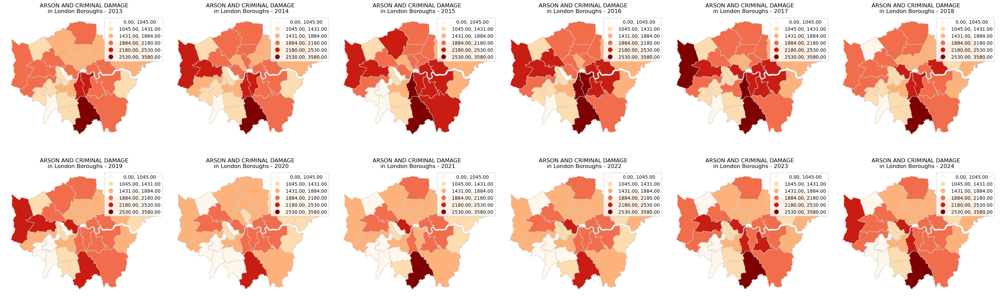

C:\Users\YU\AppData\Local\Temp\ipykernel_42320\2399006807.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  merged_borough = merge_shape_with_data(shapefile=UK_Borough, df = filtered_data, index_in_shapefle='GSS_CODE', index_in_data='Borough').fillna(0)


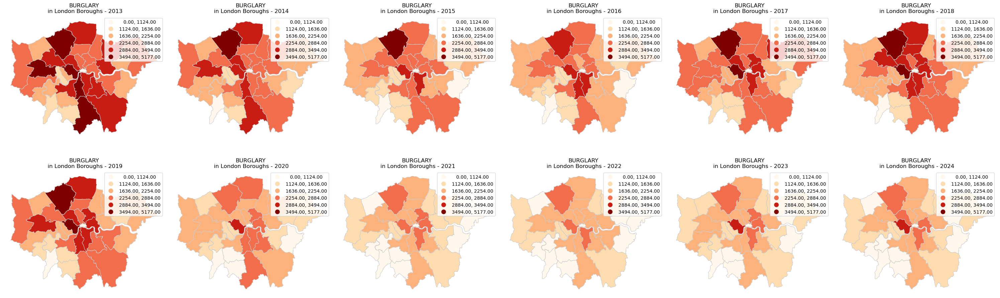

C:\Users\YU\AppData\Local\Temp\ipykernel_42320\2399006807.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  merged_borough = merge_shape_with_data(shapefile=UK_Borough, df = filtered_data, index_in_shapefle='GSS_CODE', index_in_data='Borough').fillna(0)


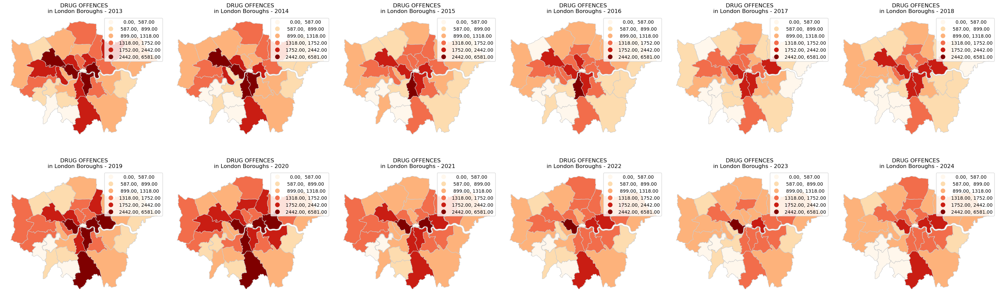

C:\Users\YU\AppData\Local\Temp\ipykernel_42320\2399006807.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  merged_borough = merge_shape_with_data(shapefile=UK_Borough, df = filtered_data, index_in_shapefle='GSS_CODE', index_in_data='Borough').fillna(0)


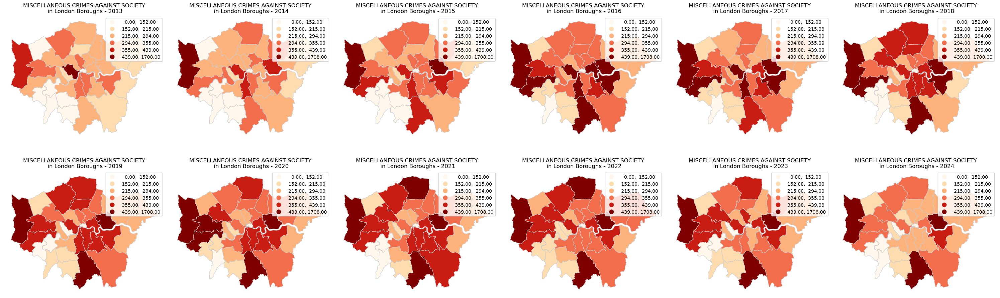

C:\Users\YU\AppData\Local\Temp\ipykernel_42320\2399006807.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  merged_borough = merge_shape_with_data(shapefile=UK_Borough, df = filtered_data, index_in_shapefle='GSS_CODE', index_in_data='Borough').fillna(0)


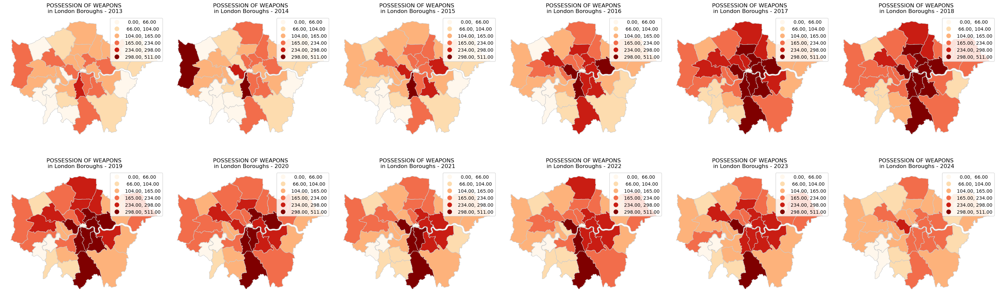

C:\Users\YU\AppData\Local\Temp\ipykernel_42320\2399006807.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  merged_borough = merge_shape_with_data(shapefile=UK_Borough, df = filtered_data, index_in_shapefle='GSS_CODE', index_in_data='Borough').fillna(0)


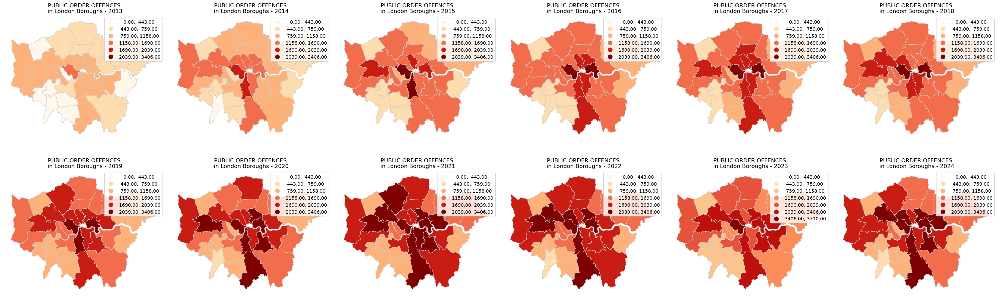

C:\Users\YU\AppData\Local\Temp\ipykernel_42320\2399006807.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  merged_borough = merge_shape_with_data(shapefile=UK_Borough, df = filtered_data, index_in_shapefle='GSS_CODE', index_in_data='Borough').fillna(0)


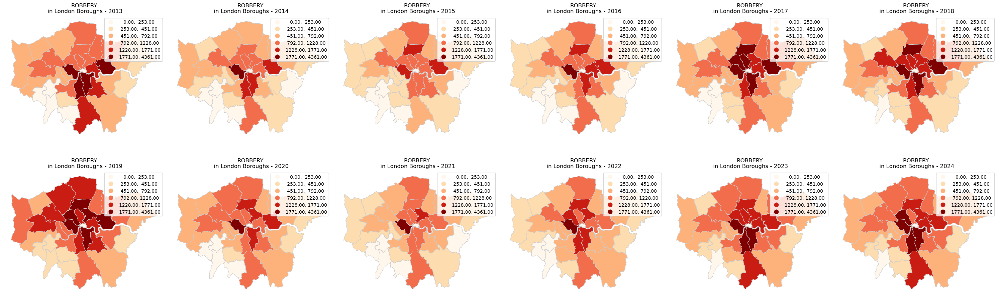

C:\Users\YU\AppData\Local\Temp\ipykernel_42320\2399006807.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  merged_borough = merge_shape_with_data(shapefile=UK_Borough, df = filtered_data, index_in_shapefle='GSS_CODE', index_in_data='Borough').fillna(0)


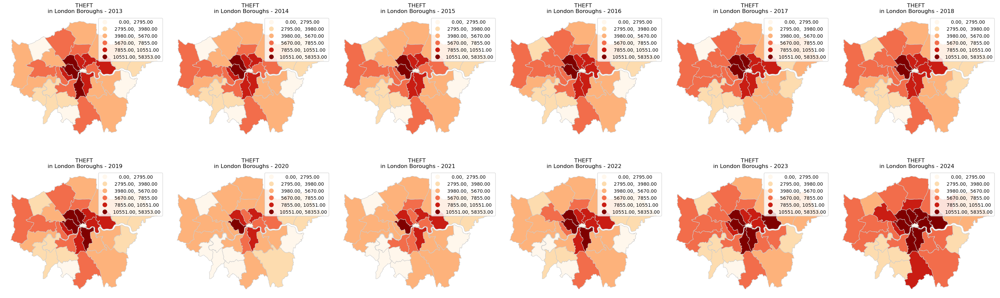

C:\Users\YU\AppData\Local\Temp\ipykernel_42320\2399006807.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  merged_borough = merge_shape_with_data(shapefile=UK_Borough, df = filtered_data, index_in_shapefle='GSS_CODE', index_in_data='Borough').fillna(0)


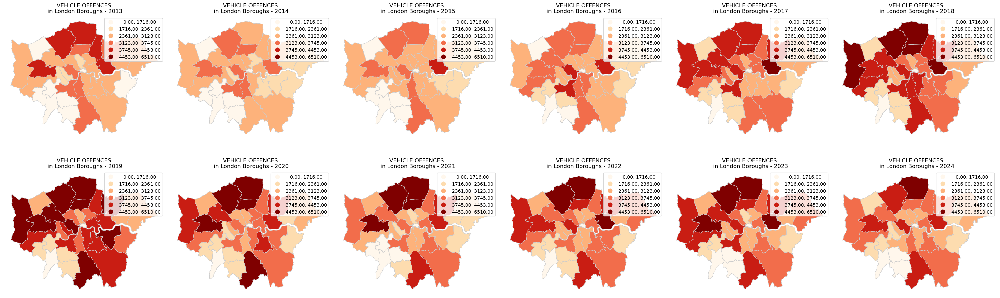

C:\Users\YU\AppData\Local\Temp\ipykernel_42320\2399006807.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  merged_borough = merge_shape_with_data(shapefile=UK_Borough, df = filtered_data, index_in_shapefle='GSS_CODE', index_in_data='Borough').fillna(0)


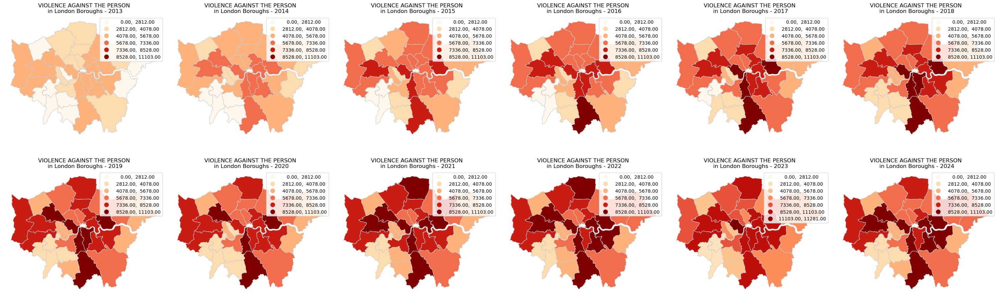

In [ ]:
major_categories = df_yearly['Major Category'].unique()

for major_cat in major_categories:
      
      filtered_data = df_yearly[df_yearly['Major Category']==major_cat].copy()

      merged_borough = merge_shape_with_data(shapefile=UK_Borough, df = filtered_data, index_in_shapefle='GSS_CODE', index_in_data='Borough').fillna(0)

      yearly_columns = merged_borough[['2011', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018',
              '2019', '2020', '2021', '2022', '2024']].stack()

      quantiles = yearly_columns.quantile([0.1, 0.25, 0.5, 0.75, 0.9, 1])

      plot_yearly_heatmaps_on_grid(merged_borough, 2011, 2024, cutpoints=quantiles.round(0).to_list(), crime = major_cat)

In [ ]:
df_yearly[df_yearly['Major Category']=='THEFT']

,LSOA Code,Borough,Major Category,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
7,E01000006,E09000002,THEFT,12.0,7.0,5.0,5.0,3.0,8.0,9.0,15.0,6.0,11.0,10.0,12.0,13.0,13.0
17,E01000007,E09000002,THEFT,94.0,120.0,97.0,73.0,77.0,89.0,109.0,99.0,150.0,110.0,108.0,112.0,172.0,138.0
27,E01000008,E09000002,THEFT,37.0,29.0,17.0,77.0,82.0,43.0,42.0,37.0,53.0,36.0,49.0,27.0,41.0,19.0
37,E01000009,E09000002,THEFT,57.0,55.0,37.0,48.0,38.0,32.0,33.0,43.0,67.0,65.0,50.0,54.0,70.0,58.0
47,E01000011,E09000002,THEFT,16.0,14.0,14.0,7.0,1.0,13.0,8.0,10.0,10.0,12.0,13.0,7.0,12.0,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49744,E01035718,E09000033,THEFT,800.0,820.0,741.0,640.0,569.0,635.0,542.0,653.0,805.0,341.0,389.0,578.0,777.0,861.0
49754,E01035719,E09000033,THEFT,58.0,29.0,22.0,19.0,23.0,25.0,27.0,17.0,33.0,18.0,8.0,19.0,22.0,33.0
49764,E01035720,E09000033,THEFT,53.0,72.0,57.0,38.0,29.0,25.0,41.0,46.0,80.0,47.0,37.0,42.0,23.0,30.0
49774,E01035721,E09000033,THEFT,260.0,283.0,309.0,272.0,311.0,282.0,290.0,274.0,421.0,147.0,121.0,276.0,391.0,328.0


In [228]:
merged_borough

,lsoa21cd,lsoa21nm,geometry,LSOA Code,Borough,Major Category,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",E01000006,E09000002,THEFT,12.0,7.0,5.0,5.0,3.0,8.0,9.0,15.0,6.0,11.0,10.0,12.0,13.0,13.0
1,E01000007,Barking and Dagenham 015A,"POLYGON ((544173.015 184701.354, 544180.164 18...",E01000007,E09000002,THEFT,94.0,120.0,97.0,73.0,77.0,89.0,109.0,99.0,150.0,110.0,108.0,112.0,172.0,138.0
2,E01000008,Barking and Dagenham 015B,"POLYGON ((543570.116 184563.91, 543581.835 184...",E01000008,E09000002,THEFT,37.0,29.0,17.0,77.0,82.0,43.0,42.0,37.0,53.0,36.0,49.0,27.0,41.0,19.0
3,E01000009,Barking and Dagenham 016B,"POLYGON ((544602.706 184628.237, 544605.228 18...",E01000009,E09000002,THEFT,57.0,55.0,37.0,48.0,38.0,32.0,33.0,43.0,67.0,65.0,50.0,54.0,70.0,58.0
4,E01000011,Barking and Dagenham 016C,"POLYGON ((544607.954 184727.846, 544620.667 18...",E01000011,E09000002,THEFT,16.0,14.0,14.0,7.0,1.0,13.0,8.0,10.0,10.0,12.0,13.0,7.0,12.0,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4983,E01035718,Westminster 019G,"POLYGON ((528044.949 180617.984, 528046.344 18...",E01035718,E09000033,THEFT,800.0,820.0,741.0,640.0,569.0,635.0,542.0,653.0,805.0,341.0,389.0,578.0,777.0,861.0
4984,E01035719,Westminster 021F,"POLYGON ((530383.75 178784.828, 530376.55 1787...",E01035719,E09000033,THEFT,58.0,29.0,22.0,19.0,23.0,25.0,27.0,17.0,33.0,18.0,8.0,19.0,22.0,33.0
4985,E01035720,Westminster 021G,"POLYGON ((529856.151 178761.747, 529856.859 17...",E01035720,E09000033,THEFT,53.0,72.0,57.0,38.0,29.0,25.0,41.0,46.0,80.0,47.0,37.0,42.0,23.0,30.0
4986,E01035721,Westminster 023H,"POLYGON ((528641.815 178630.886, 528635.688 17...",E01035721,E09000033,THEFT,260.0,283.0,309.0,272.0,311.0,282.0,290.0,274.0,421.0,147.0,121.0,276.0,391.0,328.0


In [248]:
merged_borough

,lsoa21cd,lsoa21nm,geometry,area_km2,LSOA Code,Borough,Major Category,2011,2012,2013,...,2015_area,2016_area,2017_area,2018_area,2019_area,2020_area,2021_area,2022_area,2023_area,2024_area
0,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",0.146537,E01000006,E09000002,THEFT,12.0,7.0,5.0,...,20.472646,54.593722,61.417937,102.363229,40.945291,75.066368,68.242152,81.890583,88.714798,88.714798
1,E01000007,Barking and Dagenham 015A,"POLYGON ((544173.015 184701.354, 544180.164 18...",0.200094,E01000007,E09000002,THEFT,94.0,120.0,97.0,...,384.819149,444.790964,544.743990,494.767477,749.647693,549.741641,539.746339,559.736944,859.596021,689.675877
2,E01000008,Barking and Dagenham 015B,"POLYGON ((543570.116 184563.91, 543581.835 184...",0.216901,E01000008,E09000002,THEFT,37.0,29.0,17.0,...,378.051974,198.246767,193.636377,170.584427,244.350666,165.974037,225.909106,124.480528,189.025987,87.597409
3,E01000009,Barking and Dagenham 016B,"POLYGON ((544602.706 184628.237, 544605.228 18...",0.127960,E01000009,E09000002,THEFT,57.0,55.0,37.0,...,296.967971,250.078291,257.893238,336.042704,523.601422,507.971529,390.747330,422.007116,547.046262,453.266903
4,E01000011,Barking and Dagenham 016C,"POLYGON ((544607.954 184727.846, 544620.667 18...",0.091632,E01000011,E09000002,THEFT,16.0,14.0,14.0,...,10.913185,141.871399,87.305476,109.131846,109.131846,130.958215,141.871399,76.392292,130.958215,163.697768
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4983,E01035718,Westminster 019G,"POLYGON ((528044.949 180617.984, 528046.344 18...",2.671900,E01035718,E09000033,THEFT,800.0,820.0,741.0,...,212.957050,237.658571,202.851882,244.395349,301.283700,127.624524,145.589266,216.325439,290.804267,322.242566
4984,E01035719,Westminster 021F,"POLYGON ((530383.75 178784.828, 530376.55 1787...",0.140662,E01035719,E09000033,THEFT,58.0,29.0,22.0,...,163.512084,177.730526,191.948968,120.856758,234.604294,127.965979,56.873768,135.075200,156.402863,234.604294
4985,E01035720,Westminster 021G,"POLYGON ((529856.151 178761.747, 529856.859 17...",0.151925,E01035720,E09000033,THEFT,53.0,72.0,57.0,...,190.884163,164.555313,269.870714,302.781776,526.577003,309.363989,243.541864,276.452926,151.390888,197.466376
4986,E01035721,Westminster 023H,"POLYGON ((528641.815 178630.886, 528635.688 17...",0.216843,E01035721,E09000033,THEFT,260.0,283.0,309.0,...,1434.216296,1300.479085,1337.372109,1263.586061,1941.495372,677.909310,558.006983,1272.809317,1803.146533,1512.613971


Final Cutpoints: [ 14.  42.  89. 187. 535.]


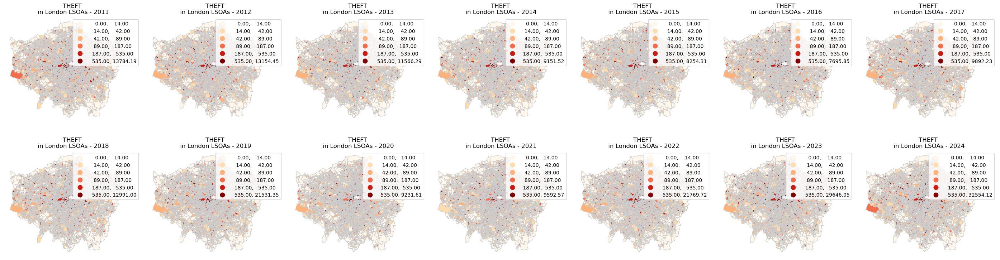

In [243]:
# 选择要分析的犯罪类型
major_cat = 'THEFT'
filtered_data = df_yearly[df_yearly['Major Category'] == major_cat].copy()

# 合并地理数据
merged_borough = UK_LSOA.merge(filtered_data, left_on='lsoa21cd', right_on='LSOA Code', how='right').fillna(0)

# 计算每个 LSOA 归一化后的犯罪率（基于面积）
for year in years:
    merged_borough[f'{year}_area'] = merged_borough[str(year)] / merged_borough['area_km2']

# 计算去重后的 quantiles 作为 cutpoints
yearly_columns = merged_borough[[f'{year}_area' for year in years]].stack()
unique_cutpoints = np.unique(yearly_columns.quantile([0.1, 0.3, 0.5, 0.7, 0.9]).round(0))

# **确保至少有两个 cutpoints，否则 geodataframe 会报错**
if len(unique_cutpoints) < 2:
    unique_cutpoints = np.linspace(yearly_columns.min(), yearly_columns.max(), 6)  # 生成 6 个等间距 cutpoints

print("Final Cutpoints:", unique_cutpoints)  # 调试打印

# 计算年份数，并根据年份自动调整子图布局
num_years = len(years)
ncols = 7  # 每行 7 个
nrows = -(-num_years // ncols)  # 向上取整计算行数

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
axes = axes.flatten()

# 遍历年份绘制地图
for i, year in enumerate(years):
    ax = axes[i]
    year_str = f'{year}_area'  # 选择归一化列

    merged_borough.plot(
        column=year_str, cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8',
        legend=True, scheme='user_defined',
        classification_kwds={'bins': unique_cutpoints}
    )

    ax.set_title(f'{major_cat}\n in London LSOAs - {year}', fontsize=12)
    ax.axis('off')

# 移除多余的空白子图
for i in range(num_years, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()
# for major_cat in major_categories:
      
#       filtered_data = df_yearly[df_yearly['Major Category']==major_cat].copy()

#       merged_borough = UK_LSOA.merge(filtered_data, left_on='lsoa21cd', right_on='LSOA Code', how='left').fillna(0)

#       for year in years:
#             merged_borough[f'{year}_area'] = merged_borough[year] / merged_borough['area_km2']

#       yearly_columns = merged_borough[[f'{year}_area' for year in years]].stack()

#       quantiles = yearly_columns.quantile([0.1, 0.25, 0.5, 0.75, 0.9, 1])

#       plot_yearly_heatmaps_on_grid(merged_borough, 2011, 2024, cutpoints=quantiles.round(0).to_list(), crime = major_cat)


In [251]:
merged_borough.describe()

,area_km2,2011,2012,2013,2014,2015,2016,2017,2018,2019,...,2015_area,2016_area,2017_area,2018_area,2019_area,2020_area,2021_area,2022_area,2023_area,2024_area
count,4988.000000,4988.000000,4988.000000,4988.000000,4988.000000,4988.000000,4988.000000,4988.000000,4988.000000,4988.000000,...,4988.000000,4988.000000,4988.000000,4988.000000,4988.000000,4988.000000,4988.000000,4988.000000,4988.000000,4988.000000
mean,0.319079,49.439655,50.419407,43.461307,39.718123,40.532478,41.143945,44.494787,43.809543,49.582999,...,220.184284,225.368335,245.506843,236.842615,264.803159,189.842334,200.179708,242.744825,291.691068,326.925512
std,0.626351,167.123929,165.418939,140.737909,116.507648,120.288894,116.137275,131.997016,152.902946,214.423749,...,477.681306,477.714218,529.947815,549.609821,725.457526,388.279027,410.954107,663.256292,850.804954,922.082919
min,0.009719,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.130168,11.000000,10.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,32.568563,31.670635,33.129123,32.254214,32.422004,28.448636,31.090410,36.949061,37.405267,37.678931
50%,0.200249,20.000000,20.000000,16.000000,15.000000,15.000000,16.000000,16.000000,16.000000,16.000000,...,81.653138,81.993956,85.635018,83.250993,85.052340,77.081346,81.548501,91.419064,98.975513,101.510894
75%,0.312230,40.000000,41.000000,36.000000,33.000000,33.000000,35.000000,38.000000,36.000000,36.000000,...,208.451565,213.696093,231.278138,227.364026,227.109074,201.247671,212.605823,230.928136,258.045076,288.121666
max,15.797523,6442.000000,6307.000000,5135.000000,3986.000000,4512.000000,4339.000000,5219.000000,6324.000000,8177.000000,...,8254.308928,7695.849083,9892.230790,12991.001881,21531.351218,9231.613657,9592.569410,21769.718225,29646.045185,32554.122670


Final Cutpoints (by LSOA distribution): [ 21.52  45.02  80.91 145.26 277.42 921.19]


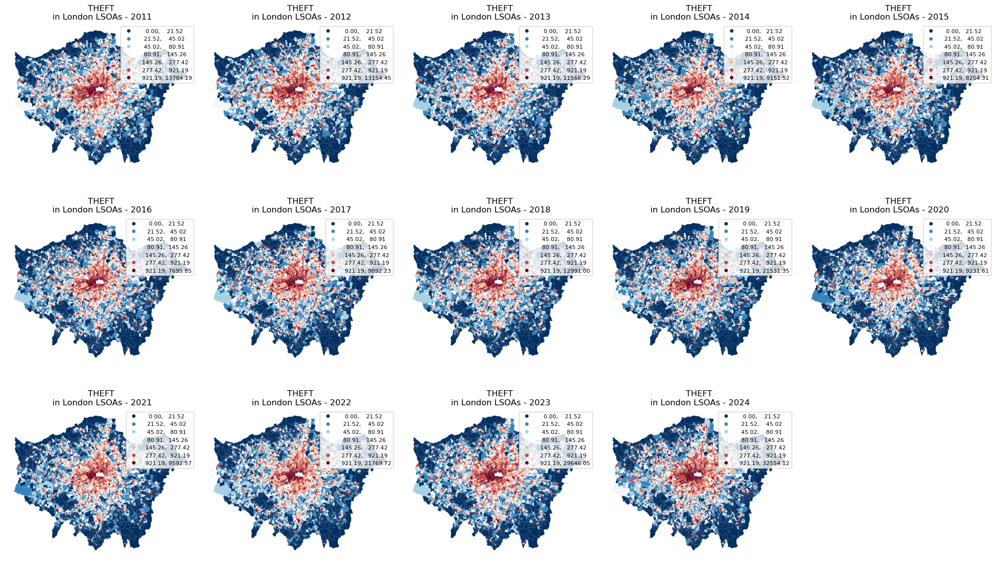

In [270]:
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd

# 选择要分析的犯罪类型
major_cat = 'THEFT'
filtered_data = df_yearly[df_yearly['Major Category'] == major_cat].copy()

# 合并地理数据
merged_borough = UK_LSOA.merge(filtered_data, left_on='lsoa21cd', right_on='LSOA Code', how='right').fillna(0)

# 计算每个 LSOA 归一化后的犯罪率（基于面积）
for year in years:
    merged_borough[f'{year}_area'] = merged_borough[str(year)] / merged_borough['area_km2']

# **计算 LSOA 的占比百分位**（按 LSOA 数量，而非值）
yearly_columns = merged_borough[[f'{year}_area' for year in years]].stack()

# **去除极端值（例如：异常大的犯罪率）**
yearly_columns = yearly_columns[yearly_columns < yearly_columns.quantile(0.95)]  # 去除95%以上的极端值

# **基于 LSOA 占比计算 cutpoints**
n_quantiles = 6  # 5 个分组（可调整）
_, bins = pd.qcut(yearly_columns, q=n_quantiles, retbins=True, duplicates="drop")

# 确保 bins 唯一 & 合理
unique_cutpoints = np.unique(bins.round(2))

# **移除 bins[0] = 0.00，确保分层从第一个有效 cutpoint 开始**
if unique_cutpoints[0] == 0.00 and len(unique_cutpoints) > 2:
    unique_cutpoints = unique_cutpoints[1:]

print("Final Cutpoints (by LSOA distribution):", unique_cutpoints)  # 调试打印

# 计算年份数，并根据年份自动调整子图布局
num_years = len(years)
ncols = 5  # 每行 5 个
nrows = -(-num_years // ncols)  # 向上取整计算行数

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
axes = axes.flatten()

# 遍历年份绘制地图
for i, year in enumerate(years):
    ax = axes[i]
    year_str = f'{year}_area'  # 选择归一化列

    merged_borough.plot(
        column=year_str, cmap='RdBu_r', linewidth=0, ax=ax, edgecolor='0.8',
        legend=True, scheme='user_defined',
        classification_kwds={'bins': unique_cutpoints},
        legend_kwds={'fontsize': 8, 'markerscale': 0.5}  # 调整图例字体大小和标记符号大小
    )

    ax.set_title(f'{major_cat}\n in London LSOAs - {year}', fontsize=12)
    ax.axis('off')

# 移除多余的空白子图
for i in range(num_years, len(axes)):
    fig.delaxes(axes[i])

# 调整子图间距
plt.subplots_adjust(hspace=0, wspace=0)  # 调整子图之间的垂直和水平间距

plt.tight_layout()
plt.show()


In [223]:
UK_LSOA

,lsoa21cd,lsoa21nm,geometry
0,E01000001,City of London 001A,"POLYGON ((532151.538 181867.433, 532152.5 1818..."
1,E01000002,City of London 001B,"POLYGON ((532634.497 181926.016, 532632.048 18..."
2,E01000003,City of London 001C,"POLYGON ((532153.703 182165.155, 532158.25 182..."
3,E01000005,City of London 001E,"POLYGON ((533619.062 181402.364, 533639.868 18..."
4,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18..."
...,...,...,...
4989,E01035718,Westminster 019G,"POLYGON ((528044.949 180617.984, 528046.344 18..."
4990,E01035719,Westminster 021F,"POLYGON ((530383.75 178784.828, 530376.55 1787..."
4991,E01035720,Westminster 021G,"POLYGON ((529856.151 178761.747, 529856.859 17..."
4992,E01035721,Westminster 023H,"POLYGON ((528641.815 178630.886, 528635.688 17..."


In [222]:
df_yearly

,LSOA Code,Borough,Major Category,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,E01000006,E09000002,ARSON AND CRIMINAL DAMAGE,4.0,9.0,5.0,8.0,8.0,8.0,5.0,12.0,7.0,6.0,5.0,6.0,5.0,5.0
1,E01000006,E09000002,BURGLARY,20.0,17.0,14.0,10.0,10.0,7.0,13.0,16.0,13.0,5.0,5.0,3.0,3.0,2.0
2,E01000006,E09000002,DRUG OFFENCES,10.0,1.0,6.0,8.0,6.0,1.0,3.0,14.0,6.0,25.0,16.0,17.0,5.0,3.0
3,E01000006,E09000002,MISCELLANEOUS CRIMES AGAINST SOCIETY,0.0,1.0,1.0,4.0,0.0,1.0,2.0,2.0,4.0,1.0,3.0,5.0,1.0,2.0
4,E01000006,E09000002,POSSESSION OF WEAPONS,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,2.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49782,E01035722,E09000033,PUBLIC ORDER OFFENCES,1.0,4.0,2.0,4.0,8.0,8.0,12.0,8.0,4.0,12.0,5.0,7.0,17.0,13.0
49783,E01035722,E09000033,ROBBERY,9.0,9.0,3.0,9.0,5.0,9.0,7.0,2.0,10.0,3.0,2.0,4.0,5.0,6.0
49784,E01035722,E09000033,THEFT,40.0,42.0,27.0,35.0,32.0,35.0,47.0,40.0,40.0,32.0,28.0,49.0,36.0,47.0
49785,E01035722,E09000033,VEHICLE OFFENCES,13.0,17.0,14.0,18.0,18.0,15.0,17.0,23.0,18.0,22.0,13.0,16.0,9.0,6.0


In [138]:
crime24 = df_yearly[["LSOA Code", "Major Category", "2024"]]
crime24 

,LSOA Code,Major Category,2024
0,E01000006,ARSON AND CRIMINAL DAMAGE,5.0
1,E01000006,BURGLARY,2.0
2,E01000006,DRUG OFFENCES,3.0
3,E01000006,MISCELLANEOUS CRIMES AGAINST SOCIETY,2.0
4,E01000006,POSSESSION OF WEAPONS,2.0
...,...,...,...
49782,E01035722,PUBLIC ORDER OFFENCES,13.0
49783,E01035722,ROBBERY,6.0
49784,E01035722,THEFT,47.0
49785,E01035722,VEHICLE OFFENCES,6.0


In [139]:
crime24 = crime24.pivot_table(index= 'LSOA Code', columns = 'Major Category', 
                                    values = "2024", fill_value = 0).reset_index()
#then rename the axis
crime24.rename_axis(None, axis=1, inplace=True)
crime24

,LSOA Code,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON
0,E01000006,5.0,2.0,3.0,2.0,2.0,6.0,6.0,13.0,21.0,29.0
1,E01000007,32.0,22.0,63.0,2.0,4.0,42.0,46.0,138.0,16.0,156.0
2,E01000008,10.0,4.0,6.0,0.0,0.0,7.0,6.0,19.0,22.0,61.0
3,E01000009,24.0,12.0,15.0,3.0,2.0,12.0,14.0,58.0,22.0,81.0
4,E01000011,11.0,5.0,8.0,4.0,0.0,5.0,5.0,15.0,8.0,54.0
...,...,...,...,...,...,...,...,...,...,...,...
4983,E01035718,62.0,23.0,98.0,4.0,7.0,95.0,84.0,861.0,203.0,241.0
4984,E01035719,6.0,2.0,4.0,0.0,0.0,7.0,6.0,33.0,3.0,32.0
4985,E01035720,3.0,5.0,1.0,1.0,1.0,7.0,3.0,30.0,8.0,23.0
4986,E01035721,32.0,22.0,11.0,3.0,1.0,26.0,25.0,328.0,23.0,115.0


In [140]:
#extract the columns to sum
cols_to_sum = [col for col in crime24.columns if "LSOA" not in col]
#sum across the columns rather than rows
crime24['Total_crime'] = 0
#sum across the columns rather than rows
crime24["Total_crime"] = crime24[cols_to_sum].sum(axis=1)
crime24

,LSOA Code,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON,Total_crime
0,E01000006,5.0,2.0,3.0,2.0,2.0,6.0,6.0,13.0,21.0,29.0,89.0
1,E01000007,32.0,22.0,63.0,2.0,4.0,42.0,46.0,138.0,16.0,156.0,521.0
2,E01000008,10.0,4.0,6.0,0.0,0.0,7.0,6.0,19.0,22.0,61.0,135.0
3,E01000009,24.0,12.0,15.0,3.0,2.0,12.0,14.0,58.0,22.0,81.0,243.0
4,E01000011,11.0,5.0,8.0,4.0,0.0,5.0,5.0,15.0,8.0,54.0,115.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4983,E01035718,62.0,23.0,98.0,4.0,7.0,95.0,84.0,861.0,203.0,241.0,1678.0
4984,E01035719,6.0,2.0,4.0,0.0,0.0,7.0,6.0,33.0,3.0,32.0,93.0
4985,E01035720,3.0,5.0,1.0,1.0,1.0,7.0,3.0,30.0,8.0,23.0,82.0
4986,E01035721,32.0,22.0,11.0,3.0,1.0,26.0,25.0,328.0,23.0,115.0,586.0


In [147]:
#we then want to turn the previous columns into percentages
#do this by dividing over the total crime columns
for col in cols_to_sum:
    crime24[col] = (crime24[col] / crime24["Total_crime"]).round(4)

In [148]:
crime24

,LSOA Code,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON,Total_crime
0,E01000006,0.0562,0.0225,0.0337,0.0225,0.0225,0.0674,0.0674,0.1461,0.2360,0.3258,89.0
1,E01000007,0.0614,0.0422,0.1209,0.0038,0.0077,0.0806,0.0883,0.2649,0.0307,0.2994,521.0
2,E01000008,0.0741,0.0296,0.0444,0.0000,0.0000,0.0519,0.0444,0.1407,0.1630,0.4519,135.0
3,E01000009,0.0988,0.0494,0.0617,0.0123,0.0082,0.0494,0.0576,0.2387,0.0905,0.3333,243.0
4,E01000011,0.0957,0.0435,0.0696,0.0348,0.0000,0.0435,0.0435,0.1304,0.0696,0.4696,115.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4983,E01035718,0.0369,0.0137,0.0584,0.0024,0.0042,0.0566,0.0501,0.5131,0.1210,0.1436,1678.0
4984,E01035719,0.0645,0.0215,0.0430,0.0000,0.0000,0.0753,0.0645,0.3548,0.0323,0.3441,93.0
4985,E01035720,0.0366,0.0610,0.0122,0.0122,0.0122,0.0854,0.0366,0.3659,0.0976,0.2805,82.0
4986,E01035721,0.0546,0.0375,0.0188,0.0051,0.0017,0.0444,0.0427,0.5597,0.0392,0.1962,586.0


In [155]:
london_crime24 = UK_LSOA.merge(crime24, left_on="lsoa21cd", right_on="LSOA Code", how="right").drop(columns='LSOA Code')
# 计算每个区域的面积，单位为平方公里
london_crime24['area_km2'] = london_crime24.geometry.area / 10**6
london_crime24['crime_per_km2'] = london_crime24['Total_crime'] / london_crime24['area_km2']
london_crime24.head()


,lsoa21cd,lsoa21nm,geometry,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON,Total_crime,area_km2,crime_per_km2
0,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",0.0562,0.0225,0.0337,0.0225,0.0225,0.0674,0.0674,0.1461,0.2360,0.3258,89.0,0.146537,607.355157
1,E01000007,Barking and Dagenham 015A,"POLYGON ((544173.015 184701.354, 544180.164 18...",0.0614,0.0422,0.1209,0.0038,0.0077,0.0806,0.0883,0.2649,0.0307,0.2994,521.0,0.200094,2603.776320
2,E01000008,Barking and Dagenham 015B,"POLYGON ((543570.116 184563.91, 543581.835 184...",0.0741,0.0296,0.0444,0.0000,0.0000,0.0519,0.0444,0.1407,0.1630,0.4519,135.0,0.216901,622.402640
3,E01000009,Barking and Dagenham 016B,"POLYGON ((544602.706 184628.237, 544605.228 18...",0.0988,0.0494,0.0617,0.0123,0.0082,0.0494,0.0576,0.2387,0.0905,0.3333,243.0,0.127960,1899.032024
4,E01000011,Barking and Dagenham 016C,"POLYGON ((544607.954 184727.846, 544620.667 18...",0.0957,0.0435,0.0696,0.0348,0.0000,0.0435,0.0435,0.1304,0.0696,0.4696,115.0,0.091632,1255.016224


In [157]:
london_crime24.crime_per_km2.sort_values()

2275        7.068130
2269        7.249097
713         7.587136
712         8.201552
261        10.707882
            ...     
822     13900.538275
876     16692.316371
4981    25633.890073
4476    32779.368466
4500    40345.318556
Name: crime_per_km2, Length: 4988, dtype: float64

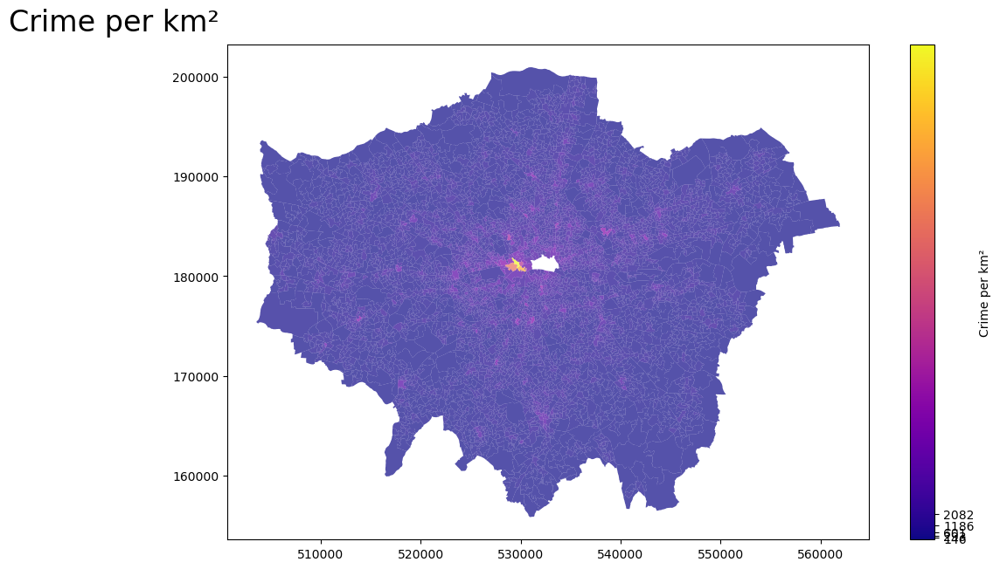

In [ ]:
# Define custom quantiles
quantiles = [0.1, 0.25, 0.5, 0.75, 0.9, 1]

# Calculate the corresponding values for these quantiles
quantile_values = london_crime24['crime_per_km2'].quantile(quantiles).values

f = plt.figure()
f.set_size_inches(12,7)

ax1 = f.add_subplot()
london_crime24.plot(column='crime_per_km2', legend=True, cmap='plasma', figsize=(12, 6), ax=ax1,
                    alpha=0.7,  # Set the transparency (0 to 1)
                    legend_kwds={'label': "Crime per km²", 'ticks': quantile_values})

f.subplots_adjust(top=0.92)
# f.suptitle(f"{measure} House Prices (Raw)", x=0.025, size=24, **tfont);
f.suptitle(f"Crime per km²", x=0.025, size=24);
plt.savefig('Total_crime_count.png', dpi=150)

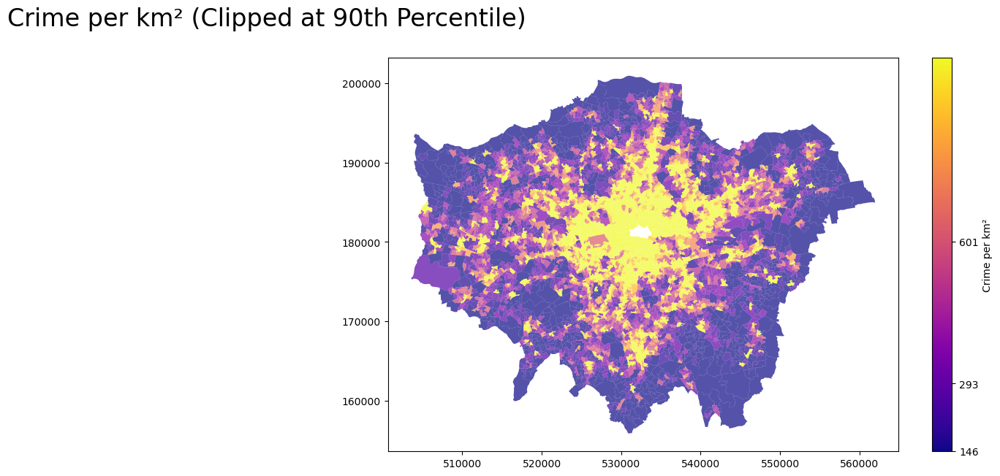

In [194]:
import numpy as np
import matplotlib.pyplot as plt

# 计算 crime_per_km2 的分位数，并限制最大值
quantiles = [0.1, 0.25, 0.5, 0.75, 0.9]  # 去掉 1 避免最大值过高
quantile_values = london_crime24['crime_per_km2'].quantile(quantiles).round(0).values
# crime_vmax = london_crime24['crime_per_km2'].quantile(0.9)  # 设置最大值阈值
crime_vmax = 1000

# 绘图
fig, ax = plt.subplots(figsize=(12, 7))

london_crime24.plot(
    column='crime_per_km2', cmap='plasma', legend=True, alpha=0.7, ax=ax,
    legend_kwds={'label': "Crime per km²", 'ticks': quantile_values},
    vmin=quantile_values[0], vmax=crime_vmax  # 限制颜色范围
)

# 标题 & 保存
fig.suptitle("Crime per km² (Clipped at 90th Percentile)", x=0.025, size=24)
plt.savefig('Total_crime_count_clipped.png', dpi=150)
plt.show()


### Getis-Ord G 统计分析*
目标：找出 统计上显著 的高值（热点）和低值（冷点）。

In [ ]:
import esda
import libpysal

# 读取数据
crime_gdf = london_crime24.copy()  # 确保不修改原数据

# 计算空间权重矩阵（邻近 LSOA）
w = libpysal.weights.KNN.from_dataframe(crime_gdf, k=8)  # 8 近邻
w.transform = "R"  # 归一化权重

# 计算 Getis-Ord G*
g_star = esda.G_Local(crime_gdf["crime_per_km2"], w)

# 存储 G* 值
crime_gdf["g_star"] = g_star.Zs  # 标准化 Z 值（Z-score）

# 设定颜色（符合 R 风格：红高蓝低）
fig, ax = plt.subplots(figsize=(8, 6))
crime_gdf.plot(
  column="g_star", cmap="RdBu_r", edgecolor="black", linewidth=0,
  legend=True, ax=ax, vmin=-3, vmax=3  # 限制范围使颜色更明显
)

# 美化图表
plt.title("Getis-Ord G* Hotspot Analysis (Red = Hot, Blue = Cold)", fontsize=12)
plt.xlabel("Longitude")
plt.ylabel("Latitude")

plt.show()


KeyError: 'crime_per_km2_standardized'

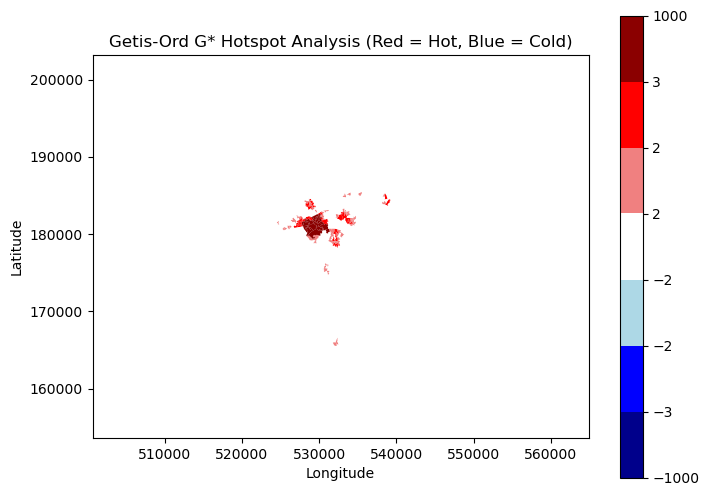

In [181]:
import esda
import libpysal
import matplotlib.colors as mcolors

# 读取数据
crime_gdf = london_crime24.copy()  # 确保不修改原数据

# 计算空间权重矩阵（邻近 LSOA）
w = libpysal.weights.KNN.from_dataframe(crime_gdf, k=8)  # 8 近邻
w.transform = "R"  # 归一化权重

# 计算 Getis-Ord G*
g_star = esda.G_Local(crime_gdf["crime_per_km2"], w)

# 存储 G* 值
crime_gdf["g_star"] = g_star.Zs  # 标准化 Z 值（Z-score）

# 定义自定义颜色映射
cmap = mcolors.ListedColormap(['darkblue', 'blue', 'lightblue', 'white', 'lightcoral', 'red', 'darkred'])
bounds = [-1000, -2.6, -2.0, -1.6, 1.6, 2.0, 2.6, 1000]
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# 绘制图表
fig, ax = plt.subplots(figsize=(8, 6))
crime_gdf.plot(
  column="g_star", cmap=cmap, norm=norm, edgecolor="black", linewidth=0,
  legend=True, ax=ax
)

# 美化图表
plt.title("Getis-Ord G* Hotspot Analysis (Red = Hot, Blue = Cold)", fontsize=12)
plt.xlabel("Longitude")
plt.ylabel("Latitude")

plt.show()

In [184]:
crime_gdf

,lsoa21cd,lsoa21nm,geometry,ARSON AND CRIMINAL DAMAGE,BURGLARY,DRUG OFFENCES,MISCELLANEOUS CRIMES AGAINST SOCIETY,POSSESSION OF WEAPONS,PUBLIC ORDER OFFENCES,ROBBERY,THEFT,VEHICLE OFFENCES,VIOLENCE AGAINST THE PERSON,Total_crime,area_km2,crime_per_km2,g_star
0,E01000006,Barking and Dagenham 016A,"POLYGON ((545126.852 184310.838, 545145.213 18...",0.0562,0.0225,0.0337,0.0225,0.0225,0.0674,0.0674,0.1461,0.2360,0.3258,89.0,0.146537,607.355157,0.644571
1,E01000007,Barking and Dagenham 015A,"POLYGON ((544173.015 184701.354, 544180.164 18...",0.0614,0.0422,0.1209,0.0038,0.0077,0.0806,0.0883,0.2649,0.0307,0.2994,521.0,0.200094,2603.776320,0.892898
2,E01000008,Barking and Dagenham 015B,"POLYGON ((543570.116 184563.91, 543581.835 184...",0.0741,0.0296,0.0444,0.0000,0.0000,0.0519,0.0444,0.1407,0.1630,0.4519,135.0,0.216901,622.402640,0.214865
3,E01000009,Barking and Dagenham 016B,"POLYGON ((544602.706 184628.237, 544605.228 18...",0.0988,0.0494,0.0617,0.0123,0.0082,0.0494,0.0576,0.2387,0.0905,0.3333,243.0,0.127960,1899.032024,0.741848
4,E01000011,Barking and Dagenham 016C,"POLYGON ((544607.954 184727.846, 544620.667 18...",0.0957,0.0435,0.0696,0.0348,0.0000,0.0435,0.0435,0.1304,0.0696,0.4696,115.0,0.091632,1255.016224,0.829727
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4983,E01035718,Westminster 019G,"POLYGON ((528044.949 180617.984, 528046.344 18...",0.0369,0.0137,0.0584,0.0024,0.0042,0.0566,0.0501,0.5131,0.1210,0.1436,1678.0,2.671900,628.017452,1.393254
4984,E01035719,Westminster 021F,"POLYGON ((530383.75 178784.828, 530376.55 1787...",0.0645,0.0215,0.0430,0.0000,0.0000,0.0753,0.0645,0.3548,0.0323,0.3441,93.0,0.140662,661.157556,0.582836
4985,E01035720,Westminster 021G,"POLYGON ((529856.151 178761.747, 529856.859 17...",0.0366,0.0610,0.0122,0.0122,0.0122,0.0854,0.0366,0.3659,0.0976,0.2805,82.0,0.151925,539.741428,0.526440
4986,E01035721,Westminster 023H,"POLYGON ((528641.815 178630.886, 528635.688 17...",0.0546,0.0375,0.0188,0.0051,0.0017,0.0444,0.0427,0.5597,0.0392,0.1962,586.0,0.216843,2702.413985,0.538812


In [183]:
crime_gdf.g_star.sort_values()

2321   -0.664870
2324   -0.657964
970    -0.649245
972    -0.647832
2407   -0.646841
          ...   
4981    7.822118
876     8.840796
4476    9.267201
875     9.587852
4500    9.690098
Name: g_star, Length: 4988, dtype: float64

In [185]:
import esda
import libpysal

# 读取数据
crime_gdf = london_crime24.copy()  # 确保不修改原数据

# 计算空间权重矩阵（邻近 LSOA）
w = libpysal.weights.KNN.from_dataframe(crime_gdf, k=8)  # 8 近邻
w.transform = "R"  # 归一化权重

# 标准化变量
crime_gdf["crime_per_km2_standardized"] = (crime_gdf["crime_per_km2"] - np.mean(crime_gdf["crime_per_km2"])) / np.std(crime_gdf["crime_per_km2"])
# # 计算 Moran's I
# moran = esda.Moran(crime_gdf["crime_per_km2"], w)

moran = esda.Moran(crime_gdf["crime_per_km2_standardized"], w)

# 输出 Moran's I 统计量
print(f"Moran's I: {moran.I}")
print(f"p-value: {moran.p_sim}")


Moran's I: 0.4630061954382625
p-value: 0.001


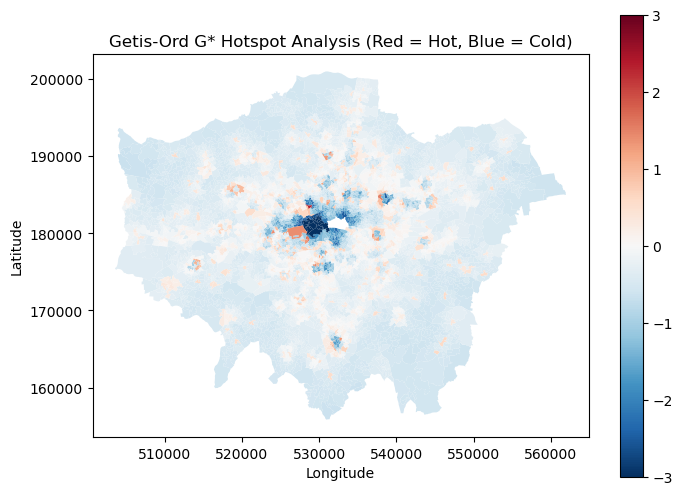

In [189]:
import esda
import libpysal

# 读取数据
crime_gdf = london_crime24.copy()  # 确保不修改原数据

# 标准化变量
crime_gdf["crime_per_km2_standardized"] = (crime_gdf["crime_per_km2"] - np.mean(crime_gdf["crime_per_km2"])) / np.std(crime_gdf["crime_per_km2"])

# 计算空间权重矩阵（邻近 LSOA）
w = libpysal.weights.KNN.from_dataframe(crime_gdf, k=8)  # 8 近邻
w.transform = "R"  # 归一化权重

# 计算 Getis-Ord G*
g_star = esda.G_Local(crime_gdf["crime_per_km2_standardized"], w)

# 存储 G* 值
crime_gdf["g_star"] = g_star.Zs  # 标准化 Z 值（Z-score）

# 设定颜色（符合 R 风格：红高蓝低）
fig, ax = plt.subplots(figsize=(8, 6))
crime_gdf.plot(
  column="g_star", cmap="RdBu_r", edgecolor="black", linewidth=0,
  legend=True, ax=ax, vmin=-3, vmax=3  # 限制范围使颜色更明显
)

# 美化图表
plt.title("Getis-Ord G* Hotspot Analysis (Red = Hot, Blue = Cold)", fontsize=12)
plt.xlabel("Longitude")
plt.ylabel("Latitude")

plt.show()
